In [2]:
#Importing the required libraries 
import pandas as pd
import seaborn as sns
import  matplotlib.pyplot as plt
import plotly.express as px
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
#Opening the path of the csv file
df=pd.read_csv("/Users/akhil/Projects/TemperaturePrediction/Mumbai.csv")
print(df.describe())
#Filling the null values with nearby values
df.fillna(method='ffill', inplace=True)
df.tmax.fillna(method='bfill', inplace=True)

               tavg         tmin         tmax         prcp
count  11883.000000  9440.000000  9987.000000  7213.000000
mean      27.762509    22.618549    32.315040    10.942007
std        2.189138     3.803629     2.234577    29.808576
min       17.700000     8.500000    22.300000     0.000000
25%       26.600000    19.800000    30.900000     0.000000
50%       28.100000    23.700000    32.400000     0.000000
75%       29.300000    25.400000    33.900000     7.100000
max       33.700000    30.400000    41.300000   461.000000


In [3]:
#Plotting the maximum temperatures 
figure = px.line(df, x="time", 
                 y="tmax", 
                 title='Maximum Temperatures in Mumbai')
figure.show()

In [4]:
#Plotting the Minimum temperatures 
figure = px.line(df, x="time", 
                 y="tmin", 
                 title='Minimum Temperature in Mumbai')
figure.show()

In [5]:
#Plotting the Average temperatures 
figure = px.line(df, x="time", 
                 y="tavg", 
                 title='Mean Temperature in Mumbai')
figure.show()

In [6]:
#Reducing the number of unimportant parameters
df=df.drop(['tmax'],axis=1)
df=df.drop(['tmin'],axis=1)
df=df.drop(["prcp"],axis=1)
#Renaming the columns from time and temperature_average(tavg)
df.rename(columns = {'time':'ds','tavg':'y'}, inplace = True)
print(df.to_string())

               ds     y
0      01-01-1990  23.2
1      02-01-1990  22.2
2      03-01-1990  21.8
3      04-01-1990  25.4
4      05-01-1990  26.5
5      06-01-1990  25.1
6      07-01-1990  26.0
7      08-01-1990  26.6
8      09-01-1990  25.1
9      10-01-1990  26.8
10     11-01-1990  25.6
11     12-01-1990  24.3
12     13-01-1990  22.4
13     14-01-1990  25.4
14     15-01-1990  23.7
15     16-01-1990  24.0
16     17-01-1990  24.8
17     18-01-1990  23.8
18     19-01-1990  25.5
19     20-01-1990  25.2
20     21-01-1990  25.4
21     22-01-1990  25.8
22     23-01-1990  26.4
23     24-01-1990  26.1
24     25-01-1990  25.5
25     26-01-1990  25.9
26     27-01-1990  25.2
27     28-01-1990  24.1
28     29-01-1990  23.8
29     30-01-1990  24.2
30     31-01-1990  24.3
31     01-02-1990  24.2
32     02-02-1990  23.2
33     03-02-1990  24.8
34     04-02-1990  23.8
35     05-02-1990  24.0
36     06-02-1990  26.0
37     07-02-1990  27.1
38     08-02-1990  27.0
39     09-02-1990  26.5
40     10-02-199

In [7]:
#Adding the year and month columns to the data frame
df["ds"] = pd.to_datetime(df["ds"], format = '%d-%m-%Y')
df['year'] = df['ds'].dt.year
df["month"] = df["ds"].dt.month
print(df.head())

          ds     y  year  month
0 1990-01-01  23.2  1990      1
1 1990-01-02  22.2  1990      1
2 1990-01-03  21.8  1990      1
3 1990-01-04  25.4  1990      1
4 1990-01-05  26.5  1990      1


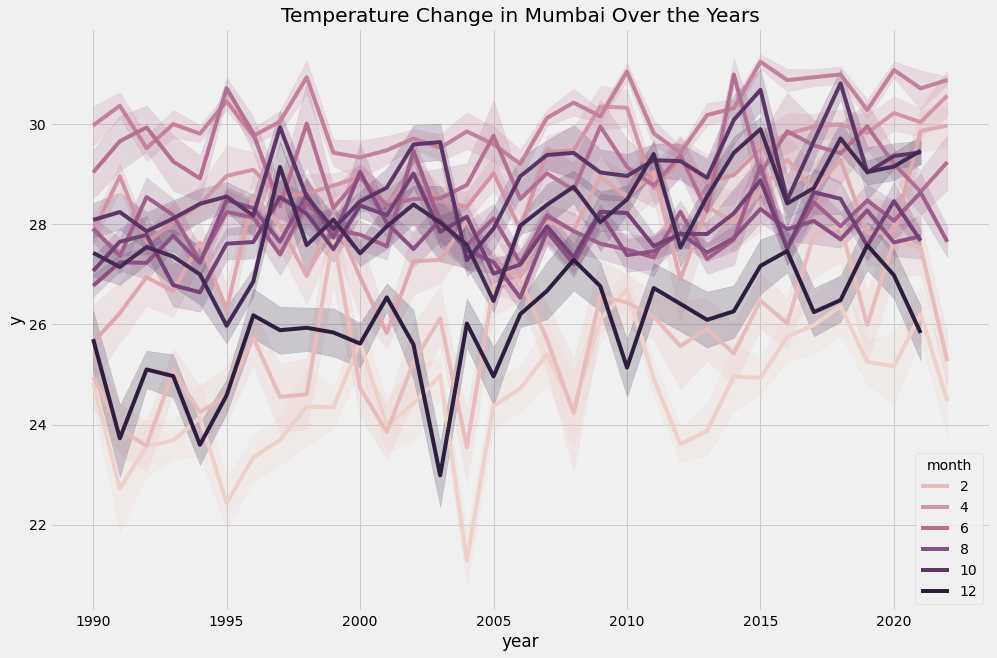

In [8]:
#Plotting the graph of how temperature changes over the years in Mumbai
plt.style.use('fivethirtyeight')
plt.figure(figsize=(15, 10))
plt.title("Temperature Change in Mumbai Over the Years")
sns.lineplot(data = df, x='year', y='y', hue='month')
plt.show()

In [9]:
#Training and Plotting data using Prophet
from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly
model = Prophet()
model.fit(df)
forecasts = model.make_future_dataframe(periods=365)
predictions = model.predict(forecasts)
plot_plotly(model, predictions)

12:56:18 - cmdstanpy - INFO - Chain [1] start processing
12:56:21 - cmdstanpy - INFO - Chain [1] done processing


In [10]:
#Performing cross validation using three parameters [initial, period, horizon]
from prophet.diagnostics import cross_validation
df_cv = cross_validation(model, initial='6000 days', period='180 days', horizon = '365 days')

  0%|          | 0/31 [00:00<?, ?it/s]

12:56:35 - cmdstanpy - INFO - Chain [1] start processing
12:56:36 - cmdstanpy - INFO - Chain [1] done processing
12:56:37 - cmdstanpy - INFO - Chain [1] start processing
12:56:38 - cmdstanpy - INFO - Chain [1] done processing
12:56:38 - cmdstanpy - INFO - Chain [1] start processing
12:56:39 - cmdstanpy - INFO - Chain [1] done processing
12:56:40 - cmdstanpy - INFO - Chain [1] start processing
12:56:42 - cmdstanpy - INFO - Chain [1] done processing
12:56:43 - cmdstanpy - INFO - Chain [1] start processing
12:56:45 - cmdstanpy - INFO - Chain [1] done processing
12:56:45 - cmdstanpy - INFO - Chain [1] start processing
12:56:47 - cmdstanpy - INFO - Chain [1] done processing
12:56:48 - cmdstanpy - INFO - Chain [1] start processing
12:56:50 - cmdstanpy - INFO - Chain [1] done processing
12:56:50 - cmdstanpy - INFO - Chain [1] start processing
12:56:52 - cmdstanpy - INFO - Chain [1] done processing
12:56:53 - cmdstanpy - INFO - Chain [1] start processing
12:56:54 - cmdstanpy - INFO - Chain [1]

In [11]:
#Cutoffs are used to determine the performance
cutoffs = pd.to_datetime(['2013-02-15', '2013-08-15', '2014-02-15'])
df_cv2 = cross_validation(model, cutoffs=cutoffs, horizon='365 days')

  0%|          | 0/3 [00:00<?, ?it/s]

12:58:15 - cmdstanpy - INFO - Chain [1] start processing
12:58:17 - cmdstanpy - INFO - Chain [1] done processing
12:58:17 - cmdstanpy - INFO - Chain [1] start processing
12:58:19 - cmdstanpy - INFO - Chain [1] done processing
12:58:20 - cmdstanpy - INFO - Chain [1] start processing
12:58:22 - cmdstanpy - INFO - Chain [1] done processing


In [12]:
#Displaying the performance metrics
from prophet.diagnostics import performance_metrics
df_p = performance_metrics(df_cv)
df_p.head()

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,37 days,1.963344,1.401194,1.071503,0.037725,0.028810,0.037753,0.801147
1,38 days,1.924082,1.387113,1.065813,0.037432,0.028758,0.037483,0.802915
2,39 days,1.893137,1.375913,1.059838,0.037142,0.028758,0.037209,0.804683
3,40 days,1.877805,1.370330,1.057297,0.037016,0.028835,0.037082,0.806452
4,41 days,1.866181,1.366082,1.055427,0.036918,0.028920,0.036984,0.808676


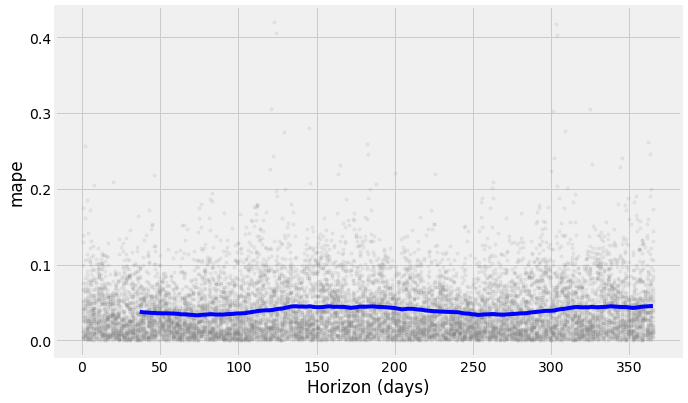

In [13]:
#Displaying the MAPE line with all the data points
from prophet.plot import plot_cross_validation_metric
fig = plot_cross_validation_metric(df_cv, metric='mape')